In [1]:
#State Visualization
#Amitava Chakraborty - 11th Jan 2019
from qiskit import IBMQ
# Loading your IBM Q account(s)
IBMQ.load_account()

<AccountProvider for IBMQ(hub='ibm-q', group='open', project='main')>

In [3]:
# Useful additional packages
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from math import pi
# Importing standard Qiskit libraries and configuring account
from qiskit import QuantumCircuit, ClassicalRegister, QuantumRegister, execute
from qiskit.tools.visualization import circuit_drawer
from qiskit.quantum_info import state_fidelity
from qiskit import BasicAer, Aer
from qiskit.tools.visualization import plot_histogram, plot_bloch_multivector
from qiskit.extensions.simulator import snapshot


#We define simulators here
s_simulator = BasicAer.get_backend('statevector_simulator')
q_simulator = BasicAer.get_backend('qasm_simulator')

In [14]:
#We create a register
q = QuantumRegister(1)
qc = QuantumCircuit(q)

In [15]:
#Let us see what state the qubit is
# execute the quantum circuit 
result = execute(qc, backend=s_simulator).result()
psi  = result.get_statevector()
print(psi)

[1.+0.j 0.+0.j]


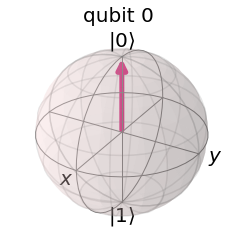

In [16]:
#Now we see how the vector looks like in Bloch Sphere
plot_bloch_multivector(psi)

In [17]:
#We want to invert the state - using an X gate
qc.x(0)
result = execute(qc, backend=s_simulator).result()
psi  = result.get_statevector()
print(psi)

[0.+0.j 1.+0.j]


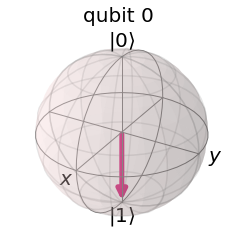

In [18]:
#Now we see how the vector looks like in Bloch Sphere
plot_bloch_multivector(psi)

In [29]:
#Let us recreate the circuit to have a Hadamard Gate only
qc = QuantumCircuit(q)
qc.h(0)
psi = execute(qc, backend=s_simulator).result().get_statevector()
print(type(psi))
print(psi)

<class 'numpy.ndarray'>
[0.70710678+0.j 0.70710678+0.j]


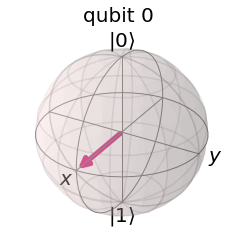

In [20]:
#And how does it looks like
plot_bloch_multivector(psi)

Now we want to get a general idea on various kinds of states
A standard way of plotting a quantum system is using the Bloch vector. 
This only works for a single qubit and takes as inputs the Bloch vector.<br>
The Bloch vector is defined as, <br> 
$[x = \mathrm{Tr}[X \rho], y = \mathrm{Tr}[Y \rho], z = \mathrm{Tr}[Z \rho]]$, <br>
where $X$, $Y$, and $Z$ are the Pauli operators for a single qubit and 
$\rho$ is the state matrix.

In [37]:
import numpy as np
from qiskit.visualization import plot_bloch_vector
coeffcientA = 1+1.j #np.complex(1,1)
print(coeffcientA)
psi_ket0 = [1.+0.j, 0.+0.j]
psi_ket1 = [0.+0.j, 1.+0.j]
psi = np.multiply(coeffcientA,psi_ket0)+psi_ket1
print(psi)

(1+1j)
[1.+1.j 1.+0.j]


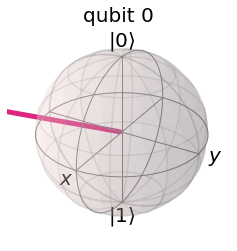

In [38]:
plot_bloch_multivector(psi)

In [43]:
coeffcientA = -2+1.j #np.complex(1,1)
coeffcientB = -5.j #np.complex(1,1)
print(coeffcientA, coeffcientB)
psi = np.multiply(coeffcientA,psi_ket0)+np.multiply(coeffcientB,psi_ket1)
print(psi)

(-2+1j) (-0-5j)
[-2.+1.j  0.-5.j]


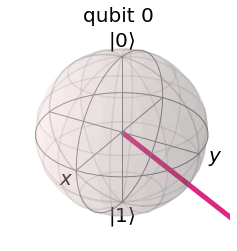

In [44]:
plot_bloch_multivector(psi)

In [47]:
#Now let us construct a two-qubit circuit and 
#apply two hadamard gates
qc = QuantumCircuit(2,2)
qc.h(0)
qc.h(1)
psi = execute(qc, backend=s_simulator).result().get_statevector()
print(psi)

[0.5+0.j 0.5+0.j 0.5+0.j 0.5+0.j]


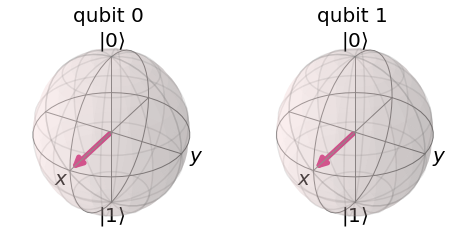

In [48]:
plot_bloch_multivector(psi)

In [53]:
#But if we measure we will get 25% probabilities to get all four states
qc.measure([0,1],[0,1])
results = execute(qc, backend=q_simulator, shots=5, memory=True).result()
print(results.get_memory())

['00', '11', '00', '10', '01']


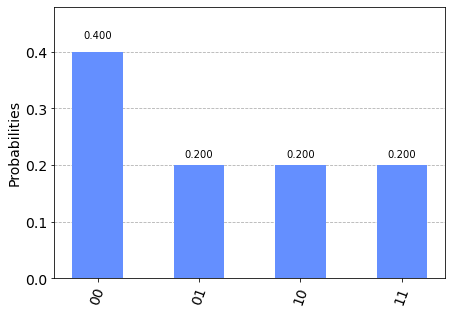

In [55]:
plot_histogram(results.get_counts())

In [98]:
#Now let us apply a Hadamard on a qubit with state |1>
#So now, after H, the qubit 0 becomes |0> + |1> and
#qubit 1 becomes |0> - |1>
qc = QuantumCircuit(2,2)
qc.h(0)
qc.x(1)
qc.h(1)
psi = execute(qc, backend=s_simulator).result().get_statevector()
print(psi)
#This psi really is (|0>+|1>)(|0>-|1>) = |00> - |01> + |10> - |11>

[ 0.5+0.000000e+00j  0.5+0.000000e+00j -0.5+6.123234e-17j
 -0.5+6.123234e-17j]


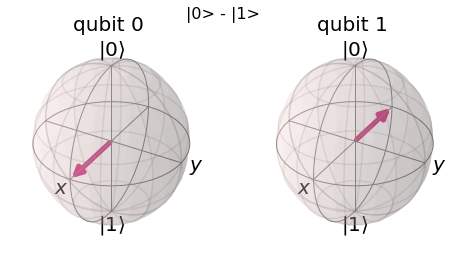

In [99]:
#And how it looks in bloch sphere
plot_bloch_multivector(psi, title='state of |0> - |1>')

In [61]:
#But on measurement, it is indistinguishable from the previous one
#Although the states of the qubits in the two experiments were different, on measurement one cannot notice that
qc.measure([0,1],[0,1])
results = execute(qc, backend=q_simulator, shots=10, memory=True).result()
print(results.get_memory())

['01', '01', '01', '01', '00', '10', '01', '11', '11', '11']


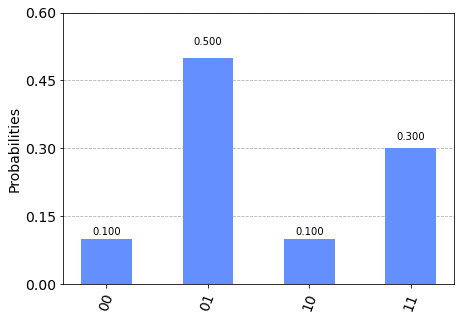

In [62]:
plot_histogram(results.get_counts())

In [93]:
#Now a plane CNOT gate
qc = QuantumCircuit(2,2)
qc.cx(0,1)
psi = execute(qc, backend=s_simulator).result().get_statevector()
print(psi)

[1.+0.j 0.+0.j 0.+0.j 0.+0.j]


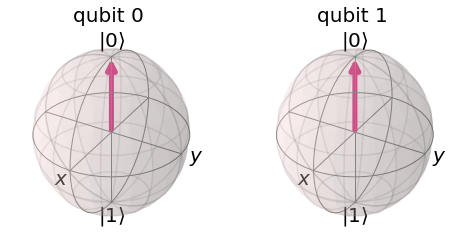

In [94]:
plot_bloch_multivector(psi)

In [95]:
#So, it is expected that always both the qubits will be at |0>
#Now let us add a H gate to q1 and apply a Rz
qc.h(1)
qc.rz(pi/2,1)
psi = execute(qc, backend=s_simulator).result().get_statevector()
print(psi)

[7.07106781e-01+0.j         0.00000000e+00+0.j
 4.32978028e-17+0.70710678j 0.00000000e+00+0.j        ]


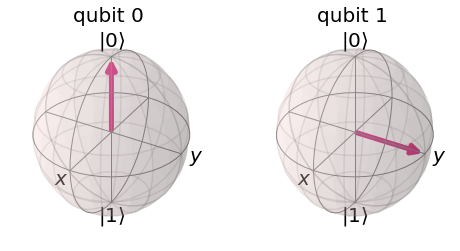

In [96]:
plot_bloch_multivector(psi)

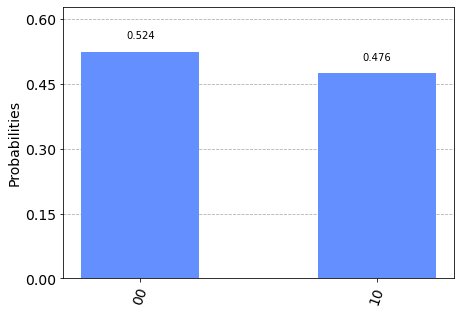

In [97]:
#So if we now measure, what will we get?
qc.measure([0,1],[0,1])
results = execute(qc, backend=q_simulator, shots=1024).result()
plot_histogram(results.get_counts())

In [100]:
#Phase Kickback
qc = QuantumCircuit(2,2)
#We add H to q0 in state |0>
qc.h(0)
#We add H to q0 in state |1>
qc.x(1)
qc.h(1)
#After this the composite state will be - (|0>+|1>)(|0>-|1>) = |00> - |01> + |10> - |11>
#Now we add a CNOT
qc.cx(0,1)
#After this the composite state will be - |00> + |01> - |10> + |11>
#i.e. = (|0>-|1>)(|0>-|1>)
#Here the phase (-) of the q2 is kicked back in q0
psi = execute(qc, backend=s_simulator).result().get_statevector()
print(psi)

[ 0.5+0.000000e+00j -0.5+6.123234e-17j -0.5+6.123234e-17j
  0.5+0.000000e+00j]


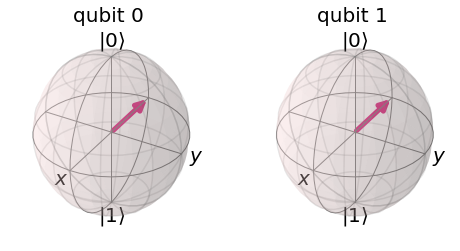

In [101]:
plot_bloch_multivector(psi)

In [102]:
#Now if we add H to both the qubits, both of them will be in state |1>
qc.h(0)
qc.h(1)
psi = execute(qc, backend=s_simulator).result().get_statevector()
print(psi)

[0.+0.0000000e+00j 0.+0.0000000e+00j 0.+0.0000000e+00j 1.-1.8369702e-16j]


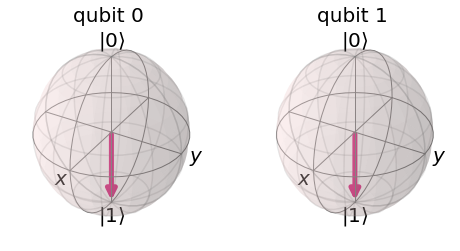

In [103]:
plot_bloch_multivector(psi)

In [171]:
#Now let us have a state |psi>=|001> in a 3-qubit system
qc = QuantumCircuit(3,3)
qc.x(2)
psi = execute(qc, backend=s_simulator).result().get_statevector()
print(psi)

[0.+0.j 0.+0.j 0.+0.j 0.+0.j 1.+0.j 0.+0.j 0.+0.j 0.+0.j]


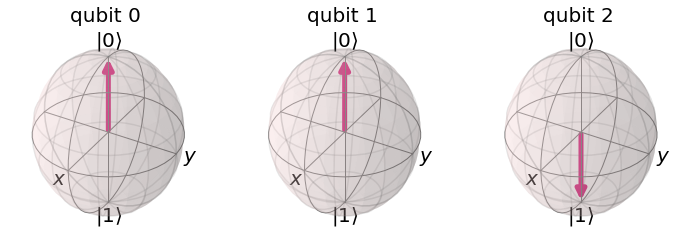

In [162]:
plot_bloch_multivector(psi)

In [172]:
#We apply a slight rotation to q2 state
qc.u3(pi/4,pi/16,0,1)
psi = execute(qc, backend=s_simulator).result().get_statevector(decimals=3)
print(psi)

[0.   +0.j    0.   +0.j    0.   +0.j    0.   +0.j    0.924+0.j
 0.   +0.j    0.375+0.075j 0.   +0.j   ]


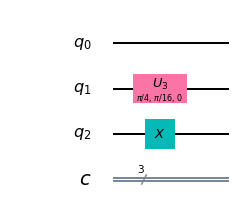

In [164]:
qc.draw(output='mpl')

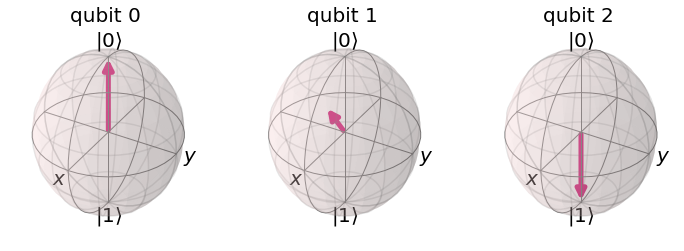

In [165]:
plot_bloch_multivector(psi)

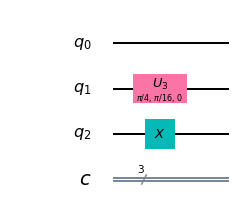

In [173]:
#Now we apply a CNOT to 1,0 - to reflect the state of q1 to q0 in reverse
qc.cx(1,0)
qc.draw(output='mpl')

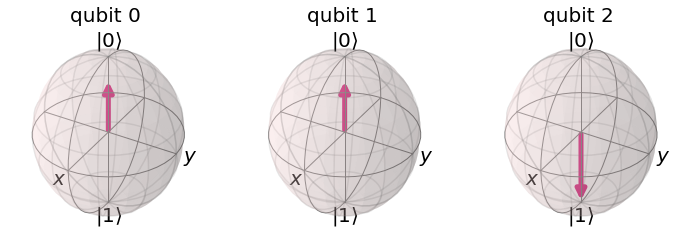

In [167]:
psi = execute(qc, backend=s_simulator).result().get_statevector()
plot_bloch_multivector(psi)

In [168]:
#But in doing so it modfied q1 as well!
print(psi)

[0.        +0.j         0.        +0.j         0.        +0.j
 0.        +0.j         0.92387953+0.j         0.        +0.j
 0.        +0.j         0.37533028+0.07465783j]


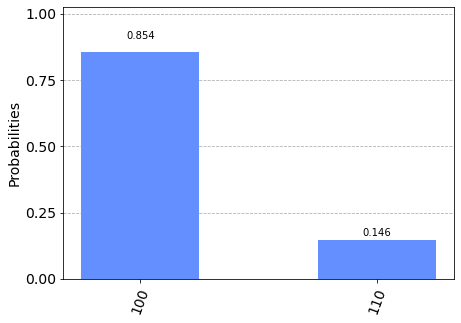

In [174]:
#Now if we measure..
qc.measure([0,1,2],[0,1,2])
result = execute(qc, backend=q_simulator, shots=4096).result()
plot_histogram(result.get_counts())

In [1]:
# to_dict() - convert qiskit.quantum_info.Statevector and qiskit.quantum_info.DensityMatrix objects into 
#Bra-Ket notation dictionary.
from qiskit.quantum_info import Statevector
from qiskit.quantum_info import DensityMatrix

state = Statevector.from_label('+0')
print(state.to_dict())


state = DensityMatrix.from_label('+0')
print(state.to_dict())



{'00': (0.7071067811865475+0j), '10': (0.7071067811865475+0j)}
{'00|00': (0.4999999999999999+0j), '10|00': (0.4999999999999999+0j), '00|10': (0.4999999999999999+0j), '10|10': (0.4999999999999999+0j)}


In [2]:
# probabilities()- qiskit.quantum_info.Statevector and qiskit.quantum_info.DensityMatrix classes
#return an array of measurement outcome probabilities in the computational basis for the specified subsystems.
from qiskit.quantum_info import Statevector
from qiskit.quantum_info import DensityMatrix

state = Statevector.from_label('+0')
print(state.probabilities())

state = DensityMatrix.from_label('+0')
print(state.probabilities())



[0.5 0.  0.5 0. ]
[0.5 0.  0.5 0. ]


In [3]:
#probabilities_dict() - qiskit.quantum_info.Statevector and qiskit.quantum_info.DensityMatrix
#return a count-style dictionary array of measurement outcome probabilities in the computational basis 
from qiskit.quantum_info import Statevector
from qiskit.quantum_info import DensityMatrix

state = Statevector.from_label('+0')
print(state.probabilities_dict())

state = DensityMatrix.from_label('+0')
print(state.probabilities_dict())



{'00': 0.4999999999999999, '10': 0.4999999999999999}
{'00': 0.4999999999999999, '10': 0.4999999999999999}


In [5]:
#sample_counts() and sample_memory() methods - Statevector and DensityMatrix
#for sampling measurement outcomes on subsystems.

#Generate a counts dictionary by sampling from a statevector
from qiskit.quantum_info import Statevector

psi = Statevector.from_label('+0')
shots = 1024

# Sample counts dictionary
counts = psi.sample_counts(shots)
print('Measure both:', counts)

# Qubit-0
counts0 = psi.sample_counts(shots, [0])
print('Measure Qubit-0:', counts0)

# Qubit-1
counts1 = psi.sample_counts(shots, [1])
print('Measure Qubit-1:', counts1)


#Return the array of measurement outcomes for each sample
psi = Statevector.from_label('-1')
shots = 10

# Sample memory
mem = psi.sample_memory(shots)
print('Measure both:', mem)

# Qubit-0
mem0 = psi.sample_memory(shots, [0])
print('Measure Qubit-0:', mem0)

# Qubit-1
mem1 = psi.sample_memory(shots, [1])
print('Measure Qubit-1:', mem1)

Measure both: {'00': 518, '10': 506}
Measure Qubit-0: {'0': 1024}
Measure Qubit-1: {'0': 516, '1': 508}
Measure both: ['01' '11' '01' '11' '01' '01' '01' '11' '01' '11']
Measure Qubit-0: ['1' '1' '1' '1' '1' '1' '1' '1' '1' '1']
Measure Qubit-1: ['1' '0' '1' '1' '1' '0' '0' '0' '0' '0']


In [6]:
#measure() method - qiskit.quantum_info.Statevector and qiskit.quantum_info.DensityMatrix
#allows sampling a single measurement outcome from the specified subsystems and 
#collapsing the statevector to the post-measurement computational basis state. 
from qiskit.quantum_info import Statevector

psi = Statevector.from_label('+1')

# Measure both qubits
outcome, psi_meas = psi.measure()
print("measure([0, 1]) outcome:", outcome, "Post-measurement state:")
print(psi_meas)

# Measure qubit-1 only
outcome, psi_meas = psi.measure([1])
print("measure([1]) outcome:", outcome, "Post-measurement state:")
print(psi_meas)

measure([0, 1]) outcome: 11 Post-measurement state:
Statevector([0.+0.j, 0.+0.j, 0.+0.j, 1.+0.j],
            dims=(2, 2))
measure([1]) outcome: 0 Post-measurement state:
Statevector([0.+0.j, 1.+0.j, 0.+0.j, 0.+0.j],
            dims=(2, 2))


In [7]:
#reset() method - qiskit.quantum_info.Statevector and qiskit.quantum_info.DensityMatrix
#reseting some or all subsystems to the |0⟩ state.
from qiskit.quantum_info import Statevector

psi = Statevector.from_label('+1')

# Reset both qubits
psi_reset = psi.reset()
print("Post reset state: ")
print(psi_reset)

# Reset qubit-1 only
psi_reset = psi.reset([1])
print("Post reset([1]) state: ")
print(psi_reset)

Post reset state: 
Statevector([1.+0.j, 0.+0.j, 0.+0.j, 0.+0.j],
            dims=(2, 2))
Post reset([1]) state: 
Statevector([0.+0.j, 1.+0.j, 0.+0.j, 0.+0.j],
            dims=(2, 2))


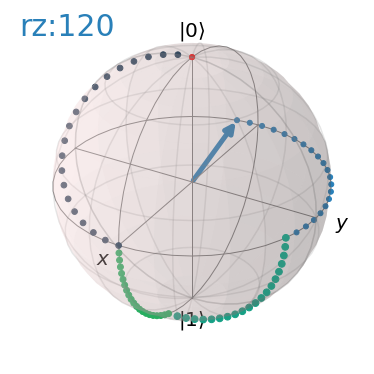

In [8]:
# qiskit.visualization.visualize_transition() - visualizing single qubit gate transitions
#It takes in a single qubit circuit and returns an animation of qubit state transitions on a Bloch sphere. 
#To use this function you must have installed the dependencies for and configured globally a matplotlib animtion writer. 
#However, in the default case simply ensuring that FFmpeg is installed is sufficient to use this function.

#Supports circuits with the following gates:
#HGate, XGate, YGate, ZGate, RXGate, RYGate, RZGate, SGate, SdgGate, TGate, TdgGate, U1Gate
from qiskit.visualization import visualize_transition
from qiskit import *

qc = QuantumCircuit(1)
qc.h(0)
qc.ry(70,0)
qc.rx(90,0)
qc.rz(120,0)

visualize_transition(qc, fpg=20, spg=1, trace=True)